###Check  GPU information and avilabilty 

In [1]:
#check GPU avaliablity 
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [2]:
#GPU type and information
!nvidia-smi

Mon Oct 10 16:43:23 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P0    30W /  70W |    284MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

To get more ram after this  crash 


*a = []*


while(1):

    a.append(‘1’)

###**Using Google drive with google colab**

In [ ]:
#Acees google drive 
from google.colab import drive

drive.mount('/content/gdrive')


In [ ]:
%load_ext tensorboard


 
###**Dealing with Koggle problems**


In [ ]:
#Update Kaggle:
#!pip uninstall -y kaggle
#!pip install --upgrade pip
#!pip install kaggle==1.5.6

#path that contains folder you want to copy
#%cd /gdrive/My Drive/...
#%cp -av YOUR_FOLDER NEW_FOLDER_COPY
#!kaggle -v
#Koggle
#import os
#os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/Colab Notebooks/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive


In [ ]:
#donload dexplot for counting plots
!pip install dexplot



     |████████████████████████████████| 174kB 12.4MB/s 


In [ ]:
!pip install tensorflow-addons


     |████████████████████████████████| 706kB 14.5MB/s 


### **Access colab notebook folder in the drive**

In [ ]:
#Acess colab Notebooks folder 
%cd '/content/'


/content


### **Load the dataset from google drive into the Colab space**

In [ ]:
#Moving the data to colab storge
zip_path = '/content/gdrive/MyDrive/Colab Notebooks/Kaggle/plant-pathology-2021-fgvc8.zip'
!cp "{zip_path}" "/content"


In [ ]:
#change to content directoy of the colab 
%cd '/content'


/content


In [ ]:
#unzip the folder of dataset
!unzip -q plant-pathology-2021-fgvc8.zip


In [ ]:
#delet the zip file 
!rm plant-pathology-2021-fgvc8.zip

### Libraries importing

In [ ]:
#Imports 
from collections import defaultdict
from collections import Counter

import os, os.path,datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#import efficientnet.keras as efn 
import tensorflow_addons as tfa
import tensorflow as tf

from tensorflow.keras.callbacks import Callback
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D,Flatten
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from keras.optimizers import Adadelta
import tensorflow.keras.backend as K

from tensorflow.keras import layers

from sklearn.model_selection import train_test_split


### **Check the number of images in the dataset folders**

In [ ]:
%cd /content/gdrive/MyDrive/Colab Notebooks/Kaggle/train_images

/content/gdrive/MyDrive/Colab Notebooks/Kaggle/train_images


In [ ]:


# path joining version for other paths
DIR = '/content/train_images'
print (len([name for name in os.listdir(DIR) if os.path.isfile(os.path.join(DIR, name))]))


18632


### **Processing the Data**

In [ ]:
#loading the images
IMAGE_PATH = '/content/gdrive/MyDrive/Colab Notebooks/Kaggle/train_images'
train_Path = '/content/gdrive/MyDrive/Colab Notebooks/Kaggle/train.csv'
#test data
IMAGE_PATH_Test = '/content/gdrive/MyDrive/Colab Notebooks/Kaggle/test_images'

train_data = pd.read_csv(train_Path)
train_data.head(5)

,image,labels
0,800113bb65efe69e.jpg,healthy
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex
2,80070f7fb5e2ccaa.jpg,scab
3,80077517781fb94f.jpg,scab
4,800cbf0ff87721f8.jpg,complex


In [ ]:
IMAGE_PATH = '/content/train_images'
train_Path = '/content//train.csv'

train_data = pd.read_csv(train_Path)
train_data.head(5)

,image,labels
0,800113bb65efe69e.jpg,healthy
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex
2,80070f7fb5e2ccaa.jpg,scab
3,80077517781fb94f.jpg,scab
4,800cbf0ff87721f8.jpg,complex



### **EDA of the data**



#### **Data Statistic**

In [ ]:
#total number of labels
print("Namber of unique labels")
labels_count = train_data['labels'].nunique()
print(labels_count)
print('unqie label value ')
uniq_labels = train_data['labels'].unique()
print(uniq_labels)
#show unique labels 
#traingroupby([df.domain.str.strip("'")]).nunique()
num_of_imgs_per_label = train_data.groupby('labels')['image'].count()
print("Number of images per each label")
print(num_of_imgs_per_label)
#check if there is missing value 
print("Missing Values")
print((train_data.isnull()).sum(axis=0))


Namber of unique labels
12
unqie label value 
['healthy' 'scab frog_eye_leaf_spot complex' 'scab' 'complex' 'rust'
 'frog_eye_leaf_spot' 'powdery_mildew' 'scab frog_eye_leaf_spot'
 'frog_eye_leaf_spot complex' 'rust frog_eye_leaf_spot'
 'powdery_mildew complex' 'rust complex']
Number of images per each label
labels
complex                            1602
frog_eye_leaf_spot                 3181
frog_eye_leaf_spot complex          165
healthy                            4624
powdery_mildew                     1184
powdery_mildew complex               87
rust                               1860
rust complex                         97
rust frog_eye_leaf_spot             120
scab                               4826
scab frog_eye_leaf_spot             686
scab frog_eye_leaf_spot complex     200
Name: image, dtype: int64
Missing Values
image     0
labels    0
dtype: int64


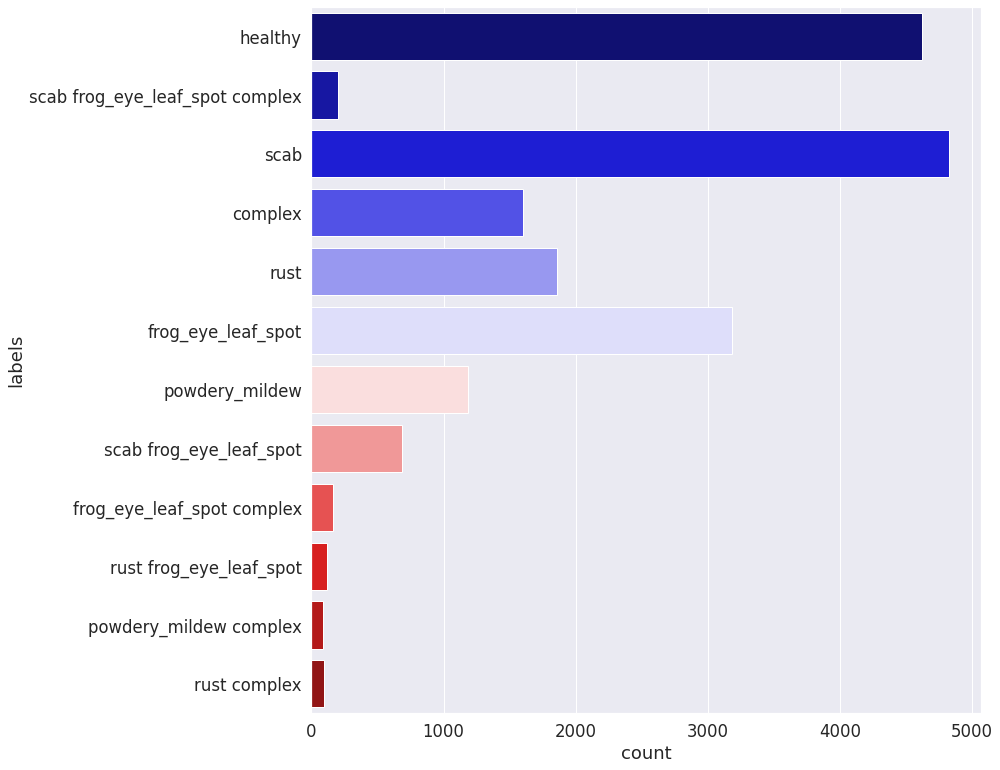

In [ ]:
#plot classes distribution 
plt.figure(figsize=(12,13))
sns.set(font_scale = 1.5)
sns.countplot(y='labels', data=train_data, palette='seismic')
plt.show()

In [ ]:
data = train_data.copy()

frequencies = data.labels.value_counts(normalize=True)
print(type(frequencies))
my_counts_precentage = list(frequencies.values * 100)
my_labels = list(frequencies.index)
df1 = pd.DataFrame( {'labels':my_labels,'precentage':my_counts_precentage})
print('Precent value of each class')
print(df1)


<class 'pandas.core.series.Series'>
Precent value of each class
                             labels  precentage
0                              scab   25.901675
1                           healthy   24.817518
2                frog_eye_leaf_spot   17.072778
3                              rust    9.982825
4                           complex    8.598111
5                    powdery_mildew    6.354659
6           scab frog_eye_leaf_spot    3.681838
7   scab frog_eye_leaf_spot complex    1.073422
8        frog_eye_leaf_spot complex    0.885573
9           rust frog_eye_leaf_spot    0.644053
10                     rust complex    0.520610
11           powdery_mildew complex    0.466939


In [ ]:
#Perecentage of each class
#https://plotly.com/python/pie-charts/
source = data['labels'].value_counts()
fig = go.Figure(data=[go.Pie(labels=source.index,values=source.values)])
fig.update_layout(title='Label distribution')
fig.show()

In [ ]:
def visualize_batch(path,image_ids, labels):
    plt.figure(figsize=(16, 12))
    
    for ind, (image_id, label) in enumerate(zip(image_ids, labels)):
        plt.subplot(4, 4, ind + 1)
        image = cv2.imread(os.path.join(path, image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(f"Class: {label}", fontsize=12)
        plt.axis("off")
    plt.show()

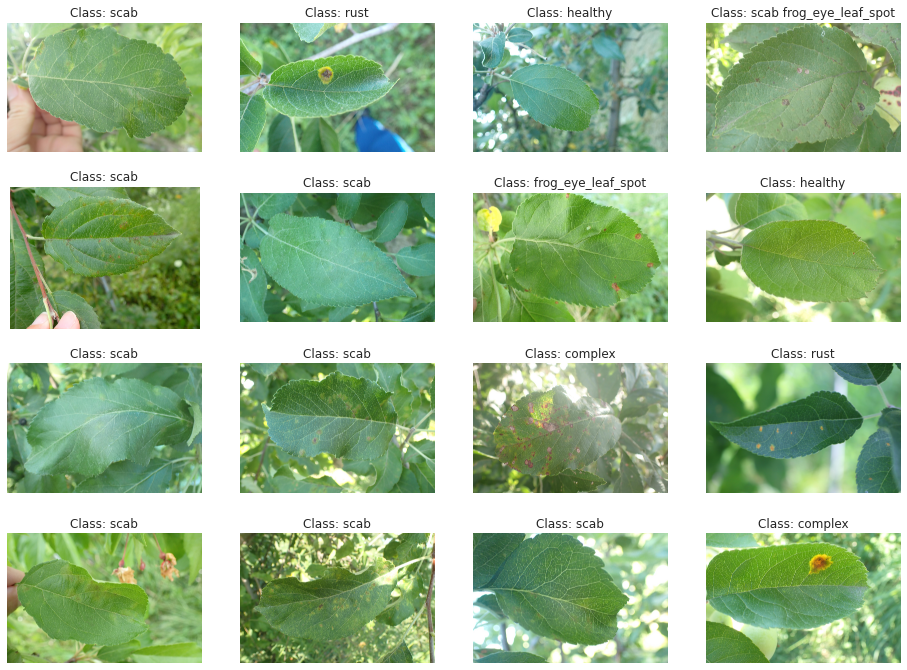

In [ ]:
#retrive random 16 images from the dataframe
data = train_data.copy()
random_samples = data.sample(n= 16)
image_ids = random_samples["image"].values
labels = random_samples["labels"].values
visualize_batch(IMAGE_PATH,image_ids,labels)

#### **Pre-Processing For Multi-label classification**





In [ ]:
#Unique classes
#Assign index of each image to the class it belong
dct = defaultdict(list)
data = train_data.copy()
for i, label in enumerate(data.labels):
   
    for category in label.split():
        dct[category].append(i)
        
dct = {key: np.array(val) for key, val in dct.items()}
dct

{'complex': array([    1,     4,     8, ..., 18597, 18604, 18617]),
 'frog_eye_leaf_spot': array([    1,    14,    31, ..., 18612, 18619, 18630]),
 'healthy': array([    0,     5,     7, ..., 18626, 18627, 18631]),
 'powdery_mildew': array([   20,    39,    44, ..., 18532, 18617, 18618]),
 'rust': array([    6,    21,    26, ..., 18601, 18616, 18629]),
 'scab': array([    1,     2,     3, ..., 18625, 18628, 18630])}

In [ ]:
# for classes
new_data_OHE = pd.DataFrame(np.zeros((data.shape[0], len(dct.keys())), dtype = np.float32), columns = dct.keys())

for key, val in dct.items():
    new_data_OHE.loc[val, key] = 1



In [ ]:
#number of images for each class 
new_data_OHE.sum(axis = 0)

healthy               4624.0
scab                  5712.0
frog_eye_leaf_spot    4352.0
complex               2151.0
rust                  2077.0
powdery_mildew        1271.0
dtype: float32

####**Distinct Label Distribution**

In [ ]:
#Precentage of each class after multi-label pre-processing
source = new_data_OHE.sum(axis = 0)
fig = go.Figure(data=[go.Pie(labels=source.index,values=source.values)])
fig.update_layout(title='Label distribution')
fig.show()

###**Loading the pre-processed**

In [ ]:
#New data Path 
path = '/content/gdrive/MyDrive/Colab Notebooks/MultiLabel_float32_new_with_sample_weghts.csv'
#Read new data
new_data = pd.read_csv(path)
#convert classes set into lists
new_data['labels'] = new_data['labels'].apply(lambda x : x.split()) 
new_data.drop(['labs'], axis=1,inplace =True)

In [ ]:
y_true = new_data[["healthy","scab","frog_eye_leaf_spot","complex","rust","powdery_mildew"]].values

### **Samples Weights Calculation**

In [ ]:
#calculate Postive and negative wight of each class 1:0
positive_weights = {}
negative_weights = {}
for c in CLASSES:
    positive_weights[c] = new_data.shape[0]/(2*np.count_nonzero(train[c]==1.))
    negative_weights[c] = new_data.shape[0]/(2*np.count_nonzero(train[c]==0.))
print(positive_weights)
print(negative_weights)

{'healthy': 2.5349659863945577, 'scab': 2.016013849816057, 'frog_eye_leaf_spot': 2.6785508913168488, 'complex': 5.460726846424384, 'rust': 5.545238095238095, 'powdery_mildew': 9.4387031408308}
{'healthy': 0.8295636687444345, 'scab': 0.9058732010890704, 'frog_eye_leaf_spot': 0.815262098538549, 'complex': 0.7058110462913857, 'rust': 0.7044234404536862, 'powdery_mildew': 0.6693490444029314}


In [ ]:
from sklearn.utils import compute_sample_weight

#{'healthy': 2.027891156462585, 'scab': 1.612746158840078, 'frog_eye_leaf_spot': 2.142754456584244, 'complex': 4.368405627198125, 'rust': 4.436011904761905, 'powdery_mildew': 7.550658561296859}
#{'healthy': 0.6636242208370436, 'scab': 0.7246693893426682, 'frog_eye_leaf_spot': 0.6521834252209678, 'complex': 0.5646261080384878, 'rust': 0.5635160680529301, 'powdery_mildew': 0.5354576807012502}
class_weights = [{0: 0.6636242208370436, 1: 2.027891156462585}, {0: 0.7246693893426682, 1: 1.612746158840078}, {0: 0.6521834252209678, 1: 2.142754456584244}, {0: 0.5646261080384878, 1: 4.368405627198125},{0: 0.5635160680529301, 1: 4.436011904761905},{0: 0.5354576807012502, 1: 7.550658561296859}] 
weights = compute_sample_weight(class_weight=class_weights, y=y_true)

In [ ]:
new_data["sample_weight"] = weights

In [ ]:
new_data

,image,labels,healthy,scab,frog_eye_leaf_spot,complex,rust,powdery_mildew,sample_weight
0,800113bb65efe69e.jpg,[healthy],1.0,0.0,0.0,0.0,0.0,0.0,0.163285
1,8002cb321f8bfcdf.jpg,"[scab, frog_eye_leaf_spot, complex]",0.0,1.0,1.0,1.0,0.0,0.0,3.022839
2,80070f7fb5e2ccaa.jpg,[scab],0.0,1.0,0.0,0.0,0.0,0.0,0.118919
3,80077517781fb94f.jpg,[scab],0.0,1.0,0.0,0.0,0.0,0.0,0.118919
4,800cbf0ff87721f8.jpg,[complex],0.0,0.0,0.0,1.0,0.0,0.0,0.413415
...,...,...,...,...,...,...,...,...,...
18627,fffb900a92289a33.jpg,[healthy],1.0,0.0,0.0,0.0,0.0,0.0,0.163285
18628,fffc488fa4c0e80c.jpg,[scab],0.0,1.0,0.0,0.0,0.0,0.0,0.118919
18629,fffc94e092a59086.jpg,[rust],0.0,0.0,0.0,0.0,1.0,0.0,0.420640
18630,fffe105cf6808292.jpg,"[scab, frog_eye_leaf_spot]",0.0,1.0,1.0,0.0,0.0,0.0,0.390709



###**Loading the data into image generator**



In [ ]:
#split the data  
data = new_data.copy()
train, val = train_test_split(data, test_size=0.2,random_state = 4321)


In [ ]:
train.head()

,image,labels,healthy,scab,frog_eye_leaf_spot,complex,rust,powdery_mildew,sample_weight
6837,b0c9d2b06da6f46c.jpg,[complex],0.0,0.0,0.0,1.0,0.0,0.0,0.413415
6942,b18fb92d5a705a2a.jpg,[frog_eye_leaf_spot],0.0,0.0,1.0,0.0,0.0,0.0,0.175561
12618,d7edebd40042c2ab.jpg,[scab],0.0,1.0,0.0,0.0,0.0,0.0,0.118919
6075,acd09e4aade0532f.jpg,[frog_eye_leaf_spot],0.0,0.0,1.0,0.0,0.0,0.0,0.175561
7801,b6b1c9db9a4c3ca0.jpg,[healthy],1.0,0.0,0.0,0.0,0.0,0.0,0.163285


In [ ]:
n_train_examples = len(train)
n_train_examples
n_val_examples = len(val)
n_val_examples
IMAGE_PATH = '/content/train_images'

In [ ]:
#Hyper paramters 
batch_size = 64
img_size_b0 = 224
img_size_b1 = 240
img_size_b4 = 380
epochs = 64 
CLASSES = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab']


In [ ]:
dataـgenrator=ImageDataGenerator(rescale=1./255,
        brightness_range=[0.2,1.2], # brightness
           vertical_flip=False,

        rotation_range=40,      # rotation
        width_shift_range=0.2,  # horizontal shift
        height_shift_range=0.2, # vertical shift
        shear_range=0.2,
        zoom_range=0.2, # zoom
        horizontal_flip=True,   # horizontal flip
        fill_mode='nearest'
                                 )
val_dataـgenrator=ImageDataGenerator(rescale=1./255. )
# flow_from_dataframe generators
#We shuffle the data using train_test_split so no need for shuffling here

train_generator = dataـgenrator\
    .flow_from_dataframe(train,
                        directory=IMAGE_PATH,
                        target_size=(img_size_b1, img_size_b1),
                        x_col="image",
                        y_col='labels',
                        weight_col = "sample_weight",
                        class_mode="categorical",
                        shuffle= True,
                        color_mode = 'rgb' ,
                        batch_size=batch_size
                        
                         
                        )
    
validation_generator = val_dataـgenrator\
    .flow_from_dataframe(val,
                        directory=IMAGE_PATH,
                        target_size=(img_size_b1, img_size_b1),
                        x_col="image",
                        y_col='labels',
                        weight_col = "sample_weight",
                        class_mode="categorical",
                        shuffle=False,
                        color_mode = 'rgb' ,
                        batch_size=batch_size
                        
                         
                        )



Found 14905 validated image filenames belonging to 6 classes.
Found 3727 validated image filenames belonging to 6 classes.


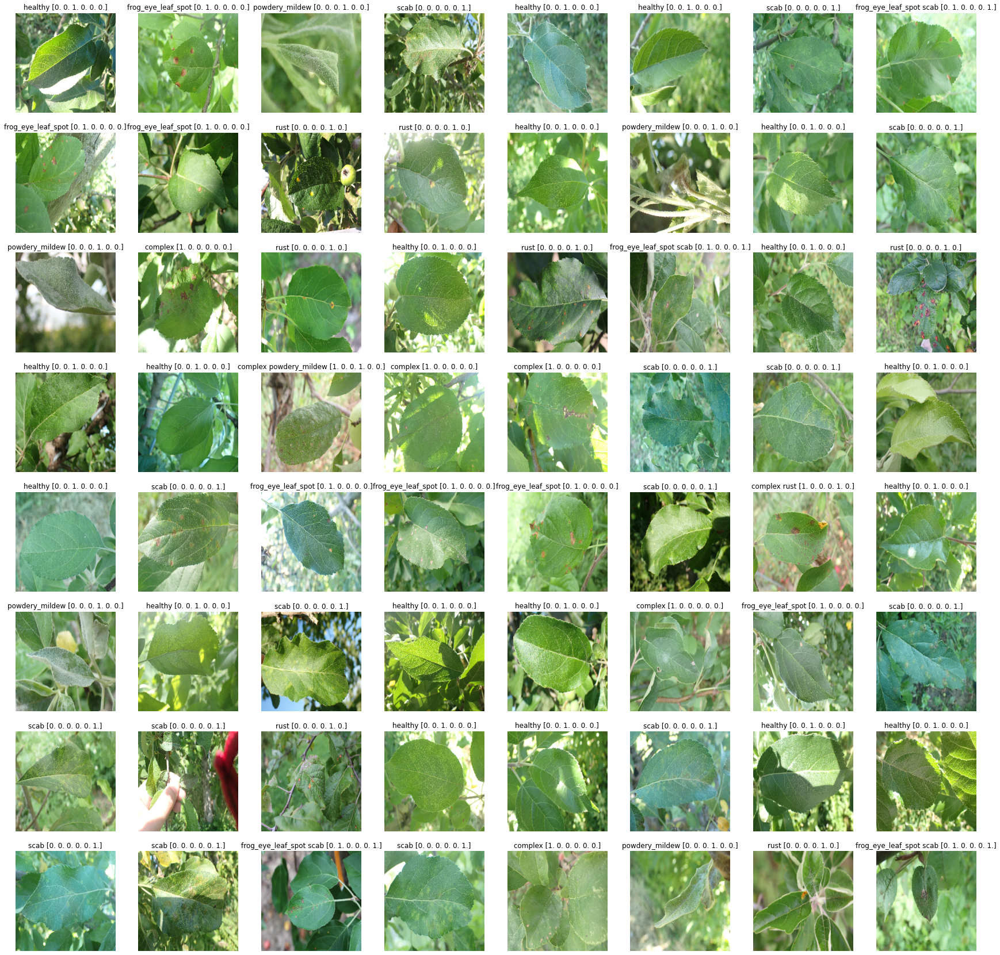

In [ ]:
validation_generator.reset()

%matplotlib inline
def show_batch(image_batch, label_batch,labels):
  plt.figure(figsize=(30,30))
  for n in range(len(image_batch)):
      ax = plt.subplot(8,8,n+1)
      plt.imshow(image_batch[n].reshape(img_size_b1,img_size_b1,-1))
      ind = (np.where(label_batch[n]==1)[0])
      label_str = [labels[i] for i in ind] 
      label_str = ' '.join(label_str)
      
      plt.title(label_str +" " +str(label_batch[n]))
      plt.axis('off')
image_batch, label_batch,_ = validation_generator[25]
show_batch(image_batch, label_batch,list(validation_generator.class_indices.keys()))
validation_generator.reset()


### **Plotting Image Augmentation**


In [ ]:

imageGen = dataـgenrator.flow(image_batch, batch_size=64, save_to_dir=None,
	save_prefix="image", save_format="jpg")
img = next(imageGen)


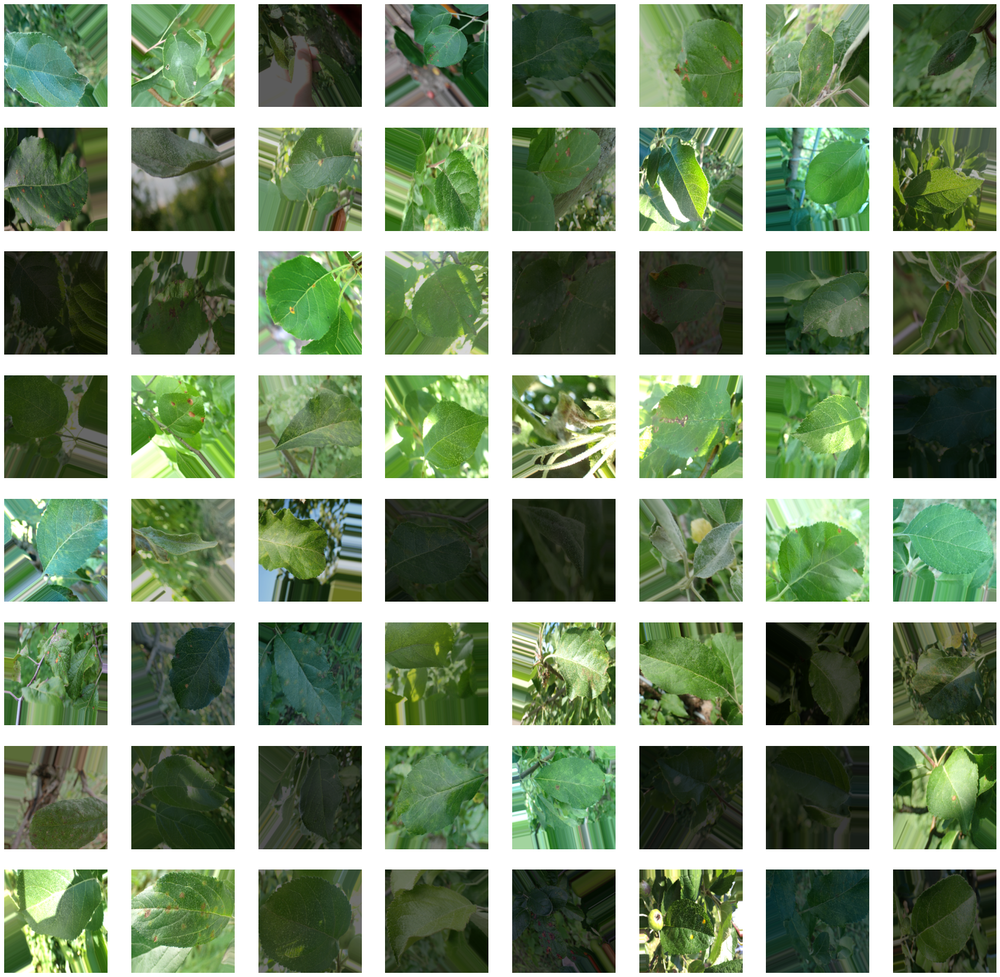

In [ ]:
plt.figure(figsize=(30,30))
plt.title("Augmentation")

for i in range(len(img)):
  plt.subplot(8,8,i+1)
  plt.imshow(img[i])
  plt.axis('off')

### **Model Building**

In [ ]:
%cd /content/gdrive/MyDrive/Colab Notebooks

/content/gdrive/MyDrive/Colab Notebooks


### **Models**

In [ ]:
def get_B0_model():
    base_model = tf.keras.applications.EfficientNetB0(include_top=False, weights='imagenet')
    base_model.trainabe = True

    inputs = layers.Input((224, 224, 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(6, activation='sigmoid')(x)
    
    return Model(inputs, outputs)

tf.keras.backend.clear_session()
model = get_B0_model()
model.summary()

16711680/16705208 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 6)                 7686      
Total params: 4,057,257
Trainable params: 4,015,234
Non-trainable params: 42,023
_________________________________________________________________


In [ ]:
#Trainable params: 4,015,234

def get_B1_model():
    base_model = tf.keras.applications.EfficientNetB1(include_top=False, weights='efficientnetb1_notop.h5')
    base_model.trainable = True

    inputs = layers.Input((img_size_b1, img_size_b1, 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(len(CLASSES), activation='sigmoid')(x)
    
    return Model(inputs, outputs)

tf.keras.backend.clear_session()
model = get_B1_model()
model.summary()

In [ ]:
def get_B4_model():
    base_model = tf.keras.applications.EfficientNetB4(include_top=False, weights='efficientnetb4_notop.h5')
    base_model.trainable = False

    inputs = layers.Input((img_size, img_size, 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(len(CLASSES), activation='sigmoid')(x)
    
    return Model(inputs, outputs)

tf.keras.backend.clear_session()
model = get_B4_model()
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 240, 240, 3)]     0         
_________________________________________________________________
efficientnetb4 (Functional)  (None, None, None, 1792)  17673823  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1792)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1792)              0         
_________________________________________________________________
dense (Dense)                (None, 6)                 10758     
Total params: 17,684,581
Trainable params: 10,758
Non-trainable params: 17,673,823
_________________________________________________________________


In [ ]:
table=pd.DataFrame(columns=["Name","Type","Shape"])
for layer in model.layers:
    table = table.append({"Name":layer.name, "Type": layer.__class__.__name__,"Shape":layer.output_shape}, ignore_index=True)

table

### **Loss Function**

In [ ]:
#tfa.losses.SigmoidFocalCrossEntropy()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
loss=tfa.losses.SigmoidFocalCrossEntropy(), 
metrics = [tfa.metrics.F1Score(num_classes=6, average='micro'),tf.keras.metrics.AUC(multi_label=True),tf.keras.metrics.Precision(),tf.keras.metrics.Recall()]
)



In [ ]:
train_generator.reset()
validation_generator.reset()

### **Training**

In [ ]:
#Tensorboard 
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
## Reduce learning rate if it gets stuck in a plateau
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=0.000001, verbose=1)
mc = ModelCheckpoint('ModelB1FullTrainingwithoutSampleWeght.hdf5', save_best_only=True, verbose=0, monitor='val_loss', mode='min')
#[{0: 1, 1: 1}, {0: 1, 1: 5}, {0: 1, 1: 1}, {0: 1, 1: 1}]
model_history = model.fit(train_generator,
                            validation_data=validation_generator,
                            steps_per_epoch=train_generator.n //batch_size,
                            validation_steps=validation_generator.n//batch_size,
                            epochs=22,
                            verbose=1,
                            callbacks = [rlr, mc,tensorboard_callback]
                           )

### **Loading the model weights from checkpoints**

In [ ]:
#'ModelB1FullTrainingwithoutSampleWeght.hdf5'
#modelB1NEw_Sample_Weghts_10_epoch_EncodeLabe1.hdf5
check_Point = 'ModelB1FullTrainingwithoutSampleWeght.hdf5'
model.load_weights(check_Point)




### **Training Plot**

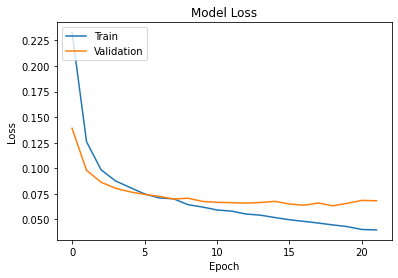

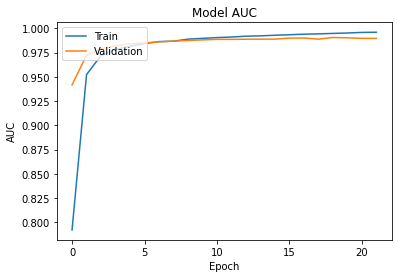

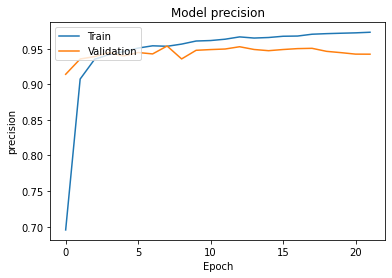

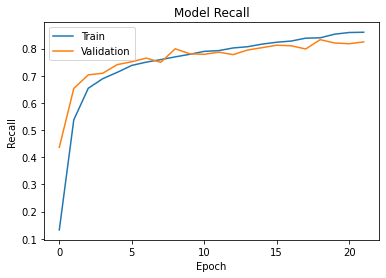

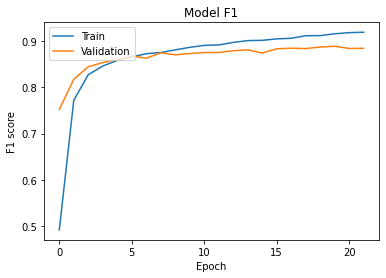

In [ ]:

# "Loss"
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# "AUC"
plt.plot(model_history.history['auc'])
plt.plot(model_history.history['val_auc'])
plt.title('Model AUC')
plt.ylabel('AUC')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# "Precsion"
plt.plot(model_history.history['precision'])
plt.plot(model_history.history['val_precision'])
plt.title('Model precision')
plt.ylabel('precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# "recall"
plt.plot(model_history.history['recall'])
plt.plot(model_history.history['val_recall'])
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# "f1"
plt.plot(model_history.history['f1_score'])
plt.plot(model_history.history['val_f1_score'])
plt.title('Model F1')
plt.ylabel('F1 score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()



### **Model Evaluation**

In [ ]:
# Evaluate model
loss, auc, f1_score,precision,recall = model.evaluate(validation_generator)
print(loss, auc, f1_score,precision,recall )

59/59 [==============================] - 452s 8s/step - loss: 0.0467 - f1_score: 0.8866 - auc: 0.9866 - precision: 0.9437 - recall: 0.8334
0.04668883979320526 0.8865714073181152 0.9866141676902771 0.9436659216880798 0.8334158658981323


### **Testing on the Validation Data**

In [ ]:
from sklearn.metrics import classification_report

y_pred = model.predict(validation_generator, batch_size=64, verbose=1)


In [ ]:
def prediction_label_indeces(preds):
   best_threshold = 0.4
   preds = preds.tolist()

   y_pred_indices = []
   for pred in preds:
     temp = []
     for category in pred:
        if category>=best_threshold:
            temp.append(pred.index(category))
     if temp!=[]:
        y_pred_indices.append(temp)
     else:
        temp.append(np.argmax(pred))
        y_pred_indices.append(temp)
    
   return y_pred_indices

In [ ]:
y_pred_indices = prediction_label_indeces(y_pred)


In [ ]:
y_true = validation_generator.classes


In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

target_names = list(validation_generator.class_indices)
y = y_true
#convert to binary 
y_t = MultiLabelBinarizer().fit_transform(y)
y_p = MultiLabelBinarizer().fit_transform(y_pred_indices)


**Confusion Matrix**

In [ ]:
from sklearn.metrics import multilabel_confusion_matrix
print('Confusion Matrix')
cs_matrix = multilabel_confusion_matrix(y_t, y_p)
cs_matrix

Confusion Matrix


array([[[3151,  131],
        [ 120,  325]],

       [[2725,  128],
        [  93,  781]],

       [[2753,   25],
        [  18,  931]],

       [[3428,   15],
        [  26,  258]],

       [[3294,   36],
        [  30,  367]],

       [[2519,  117],
        [  87, 1004]]])

### **Ploting Confusion Matrix**

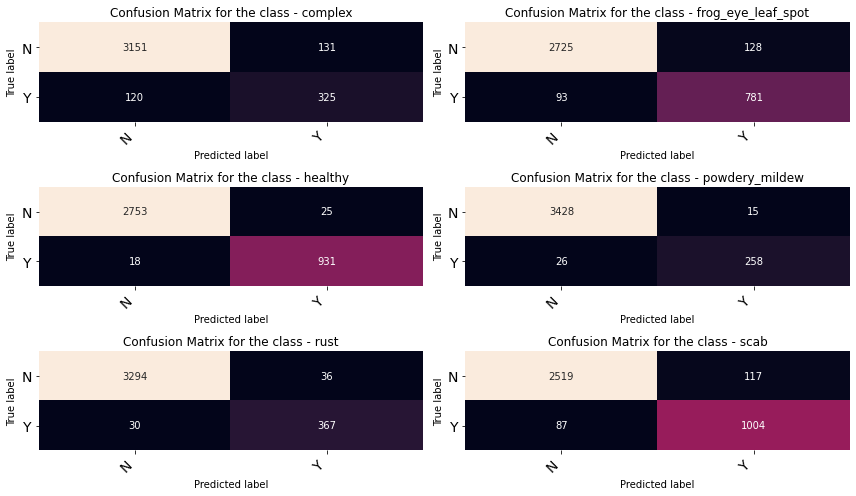

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

labels = validation_generator.class_indices

def print_confusion_matrix(confusion_matrix, axes, class_label, class_names, fontsize=14):
  
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names,
    )

    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d", cbar=False, ax=axes)
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    axes.set_ylabel('True label')
    axes.set_xlabel('Predicted label')
    axes.set_title("Confusion Matrix for the class - " + class_label)
labels = ["".join( str(i)) for i in list(labels.keys()) ]


fig, ax = plt.subplots(3, 2, figsize=(12, 7)) 
for axes, cfs_matrix, label in zip(ax.flatten(), cs_matrix, labels):
        print_confusion_matrix(cfs_matrix, axes, label, ["N", "Y"])
    
fig.tight_layout()
plt.show()


### **Classification Report**

In [ ]:
from sklearn.metrics import classification_report
print('Classification Report')
target_names = list(validation_generator.class_indices.keys())
print(classification_report(y_t, y_p, target_names=target_names))


Classification Report
                    precision    recall  f1-score   support

           complex       0.71      0.73      0.72       445
frog_eye_leaf_spot       0.86      0.89      0.88       874
           healthy       0.97      0.98      0.98       949
    powdery_mildew       0.95      0.91      0.93       284
              rust       0.91      0.92      0.92       397
              scab       0.90      0.92      0.91      1091

         micro avg       0.89      0.91      0.90      4040
         macro avg       0.88      0.89      0.89      4040
      weighted avg       0.89      0.91      0.90      4040
       samples avg       0.92      0.93      0.92      4040



### **Prediction Image Plot**

In [ ]:
bs_img,bs_label,_ = validation_generator[0]

In [ ]:
#Convert binary true labels to list of strings
label_list = []
for i in bs_label:
    ind = (np.where(i==1)[0])
    CLASSES = list(validation_generator.class_indices.keys())
    label = [CLASSES[i] for i in ind]
    label_list.append(label)

In [ ]:
#classes lists
list(validation_generator.class_indices.keys())

['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab']

In [ ]:
#Binary represention
bs_label[0:10]

array([[0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0.],
       [1., 1., 0., 0., 0., 1.],
       [0., 1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0., 1.],
       [0., 1., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
label_list[0:10]

[['rust'],
 ['complex'],
 ['complex', 'frog_eye_leaf_spot', 'scab'],
 ['frog_eye_leaf_spot'],
 ['frog_eye_leaf_spot'],
 ['complex'],
 ['rust'],
 ['healthy'],
 ['frog_eye_leaf_spot', 'scab'],
 ['frog_eye_leaf_spot']]

In [ ]:
y_pre = model.predict(bs_img)
best_threshold = 0.4
preds = y_pre[0:10].tolist()

y_pred_indices = []
for pred in preds:
    temp = []
    for category in pred:
        if category>=best_threshold:
            temp.append(pred.index(category))
    if temp!=[]:
        y_pred_indices.append(temp)
    else:
        temp.append(np.argmax(pred))
        y_pred_indices.append(temp)
    
print(y_pred_indices)

[[4], [1], [0], [1], [1], [0], [4], [2], [0, 1, 5], [1]]


In [ ]:
#String label
labels = list(validation_generator.class_indices.keys())
predicted_labels = []


for y_p_val in y_pred_indices:
    temp = []
    for i in y_p_val:
        temp.append(str(labels[i]))
    predicted_labels.append(' '.join(temp))

print(predicted_labels)

['rust', 'frog_eye_leaf_spot', 'complex', 'frog_eye_leaf_spot', 'frog_eye_leaf_spot', 'complex', 'rust', 'healthy', 'complex frog_eye_leaf_spot scab', 'frog_eye_leaf_spot']


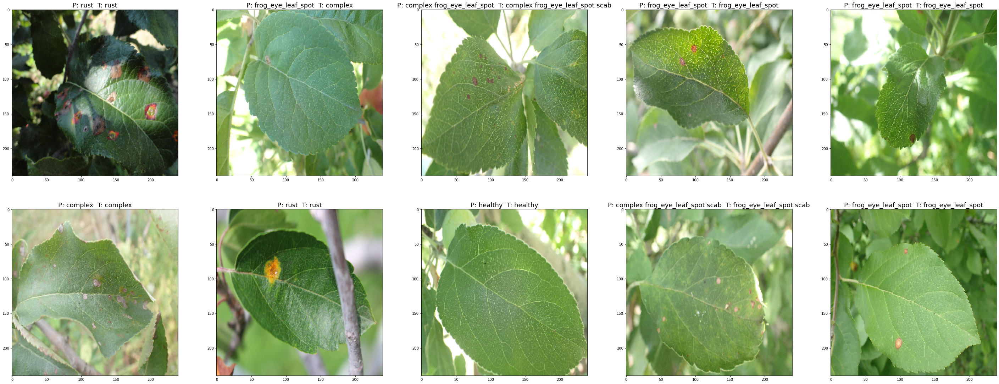

In [ ]:
fig = plt.figure(figsize=(50, 50))
 
#print(y_pred)

for i,img in enumerate(bs_img[0:10]):
  img = np.reshape(img,[240,240,3])
  fig.add_subplot(5,5, i+1)
  plt.title('P: '+predicted_labels[i]+"  T: "+" ".join(label_list[i]),fontsize=18)
  #plt.imshow(img/256.)
  plt.imshow(img)
plt.show()

### **Testing on the test Data** 

In [ ]:
test_path = '/content/test_images'
test_csv = '/content/sample_submission.csv'
df_test = pd.read_csv(test_csv)

df_test

,image,labels
0,85f8cb619c66b863.jpg,healthy
1,ad8770db05586b59.jpg,healthy
2,c7b03e718489f3ca.jpg,healthy


In [ ]:
test_generator = ImageDataGenerator(rescale=1./255)
labels = (validation_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
print(labels)

test_data = test_generator.flow_from_dataframe( df_test,
    directory = test_path,
    x_col="image",
    y_col= None,
    color_mode="rgb",
    target_size = (240,240),
    classes=None,
    class_mode=None,
    batch_size=3,
    shuffle=False,
    seed=40,)

{0: 'complex', 1: 'frog_eye_leaf_spot', 2: 'healthy', 3: 'powdery_mildew', 4: 'rust', 5: 'scab'}
Found 3 validated image filenames.


In [ ]:
#predict 
y_test_p = model.predict(test_data)


In [ ]:
y_test_p

array([[0.01781136, 0.00840306, 0.63545394, 0.0176381 , 0.02556833,
        0.3338902 ],
       [0.363832  , 0.21766534, 0.01947499, 0.05272245, 0.07541636,
        0.36358   ],
       [0.0252823 , 0.7619038 , 0.03412873, 0.01416779, 0.08342803,
        0.04992923]], dtype=float32)

In [ ]:
best_threshold = 0.4
preds = y_test_p.tolist()
y_ptest_indices = []
for pred in preds:
    temp = []
    for category in pred:
        if category>=best_threshold:
            temp.append(pred.index(category))
    if temp!=[]:
        y_ptest_indices.append(temp)
    else:
        temp.append(np.argmax(pred))
        y_ptest_indices.append(temp)
    
print(y_ptest_indices)


[[2], [0], [1]]


In [ ]:
#String label
predicted_labels = []


for y_ptest in y_ptest_indices:
    temp = []
    for i in y_ptest:
        temp.append(str(labels[i]))
    predicted_labels.append(' '.join(temp))

print(predicted_labels)

['healthy', 'complex', 'frog_eye_leaf_spot']


In [ ]:
#Submission CSV
#sumbit the csv 
test_csv = '/content/sample_submission.csv'
path_submission = "/content/gdrive/MyDrive/22epochfwithoutsampleWeghtB1/submission.csv"
sub_sample = pd.read_csv(test_csv)
sub_sample['labels'] = predicted_labels
sub_sample.to_csv(path_submission, index=False)
sub_sample

,image,labels
0,85f8cb619c66b863.jpg,healthy
1,ad8770db05586b59.jpg,complex
2,c7b03e718489f3ca.jpg,frog_eye_leaf_spot
